FICHIER ORIGINAL
https://drive.google.com/file/d/1u4S5ILT6fCFk8J3Nkpyom9-pKjETI_u0/view?usp=drive_web

FICHIER AUGMENTEe

Nous avons un corpus de 6H 20 minutes environ  pour 505 fichiers audios 

https://drive.google.com/drive/folders/1a3ib870vDQma6QSiQWFvDmyrwY0JPxJl?usp=drive_link



FICHIER ARABE

https://drive.google.com/drive/folders/1XgpbBNOgEOn-ilA9zwqH-rr6iWOhp6MK?usp=sharing

Mon commentaire 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import librosa
import IPython.display as ipd
from langdetect import detect
import csv
import os
import langid
import librosa.display
import IPython.display as ipd
from IPython.display import Audio, display
import langid
import soundfile as sf 
import seaborn as sns
from pydub import AudioSegment

## Loading audio files

In [4]:
Audio_file = "C:\\Users\\angej\\Desktop\\Multilingual\\Beware_of_false_experts\\2020_03_25_000030-ci-covid19-unesco_msg03_eng.wav"


In [5]:
# load audio files with librosa
Audio_file, sr = librosa.load(Audio_file)


## Basic information regarding audio files

In [6]:
Audio_file.shape


(809636,)

In [7]:
# duration in seconds of 1 sample
sample_duration = 1 / sr
print(f"One sample lasts for {sample_duration:6f} seconds")


One sample lasts for 0.000045 seconds


## VISUALISATION DES CARACTERISTIQUES AUDIO

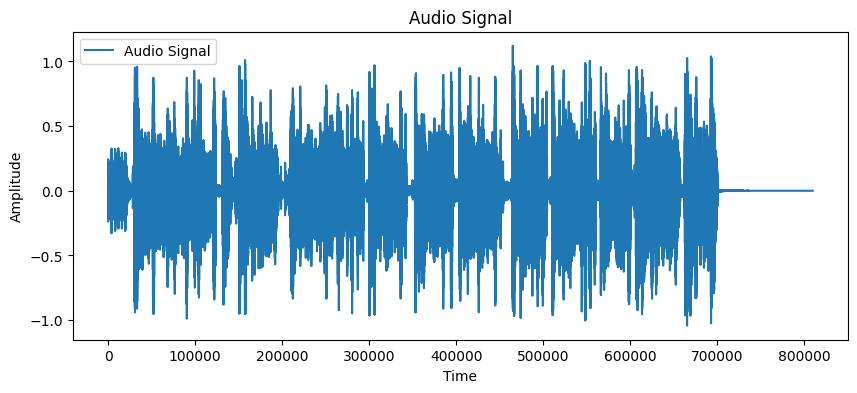

In [8]:
# Créer un graphique
plt.figure(figsize=(10, 4))
plt.plot(Audio_file, label='Audio Signal')
plt.title('Audio Signal')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.legend()
plt.show()

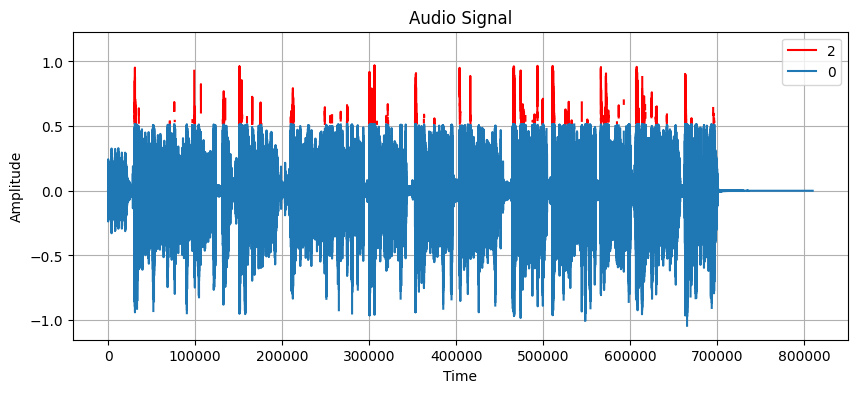

In [9]:
# Créer un graphique
plt.figure(figsize=(10, 4))

# Définir la condition pour les amplitudes à colorer en rouge
red_condition = Audio_file > np.percentile(Audio_file, 99.50)  # Les 5% d'amplitudes les plus élevées

# Tracer les points de données en rouge si la condition est vraie
plt.plot(np.where(red_condition, Audio_file, np.nan), color='red', label='High Amplitude')

# Tracer les autres points de données en bleu
plt.plot(np.where(~red_condition, Audio_file, np.nan), label='Normal Amplitude')

plt.title('Audio Signal')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.legend("2020_03_25_000030-ci-covid19-unesco_msg03_eng.wav")
plt.grid(True)

plt.show()

In [10]:
%pip install --upgrade scipy

Note: you may need to restart the kernel to use updated packages.


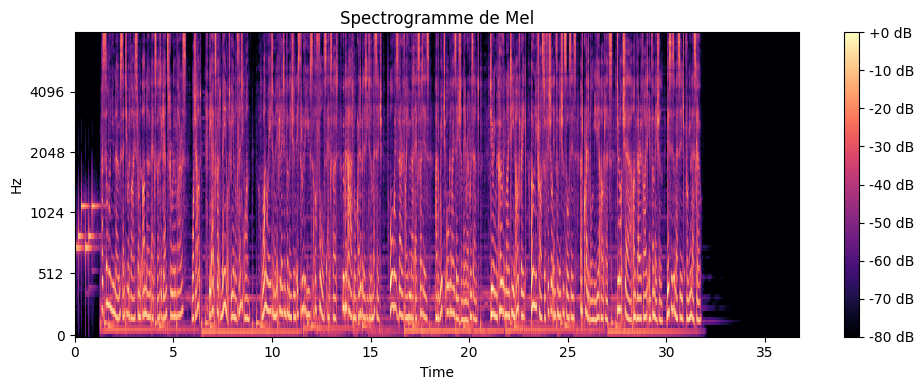

In [15]:
import librosa
import matplotlib.pyplot as plt
import librosa.display
import numpy as np


# Obtenir le spectre de Mel
S = librosa.feature.melspectrogram(y=Audio_file, sr=sr, n_mels=128, fmax=8000)

# Visualiser le spectre de Mel
plt.figure(figsize=(10, 4))
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogramme de Mel')
plt.tight_layout()
plt.show()


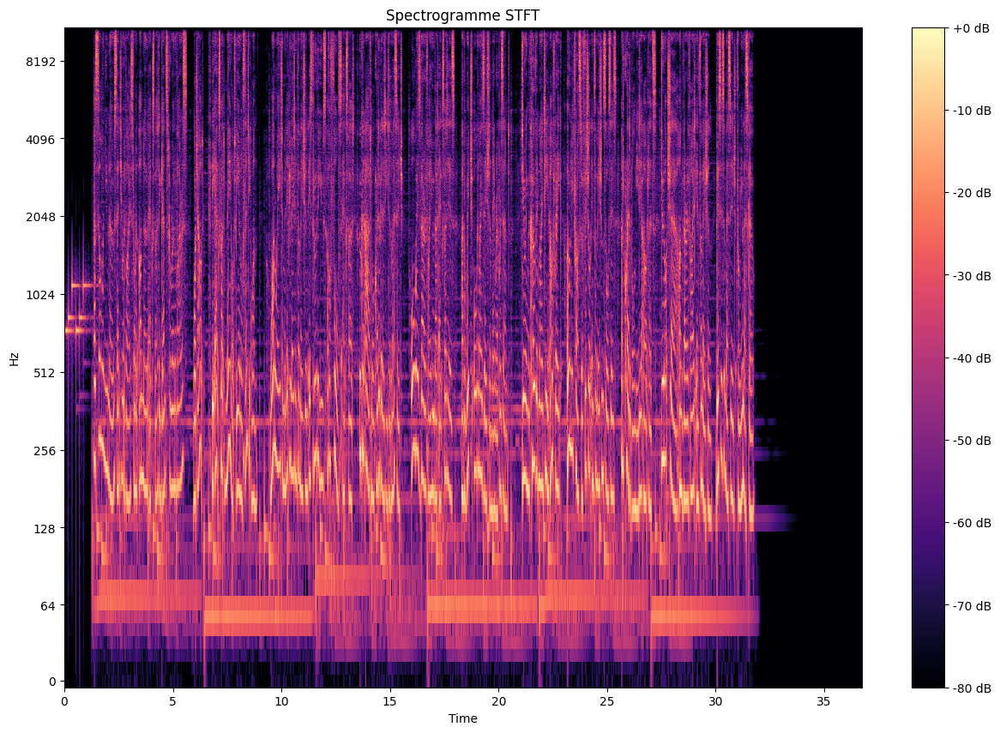

In [16]:
# Effectuer la STFT
D = librosa.stft(Audio_file)

# Convertir en amplitude
D_amp = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Visualiser l'analyse temporelle et fréquentielle
plt.figure(figsize=(15, 10))
librosa.display.specshow(D_amp, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogramme STFT')
plt.show()

In [17]:
# Obtenir le ton chromatique
C = librosa.feature.chroma_cqt(y=Audio_file, sr=sr)

# Obtenir le contraste spectral
contrast = librosa.feature.spectral_contrast(S=S, sr=sr)

# Obtenir les statistiques
mean_S = np.mean(S)
std_S = np.std(S)
mean_C = np.mean(C)
std_C = np.std(C)
mean_contrast = np.mean(contrast)
std_contrast = np.std(contrast)

print(f'Standard deviation Mel spectrogram: {std_S}')
print(f'Mean Chroma: {mean_C}')
print(f'Standard deviation Chroma: {std_C}')
print(f'Mean Spectral contrast: {mean_contrast}')
print(f'Standard deviation Spectral contrast: {std_contrast}')

Standard deviation Mel spectrogram: 52.89115524291992
Mean Chroma: 0.3550342619419098
Standard deviation Chroma: 0.2855253517627716
Mean Spectral contrast: 20.952444924318275
Standard deviation Spectral contrast: 10.401011538983635


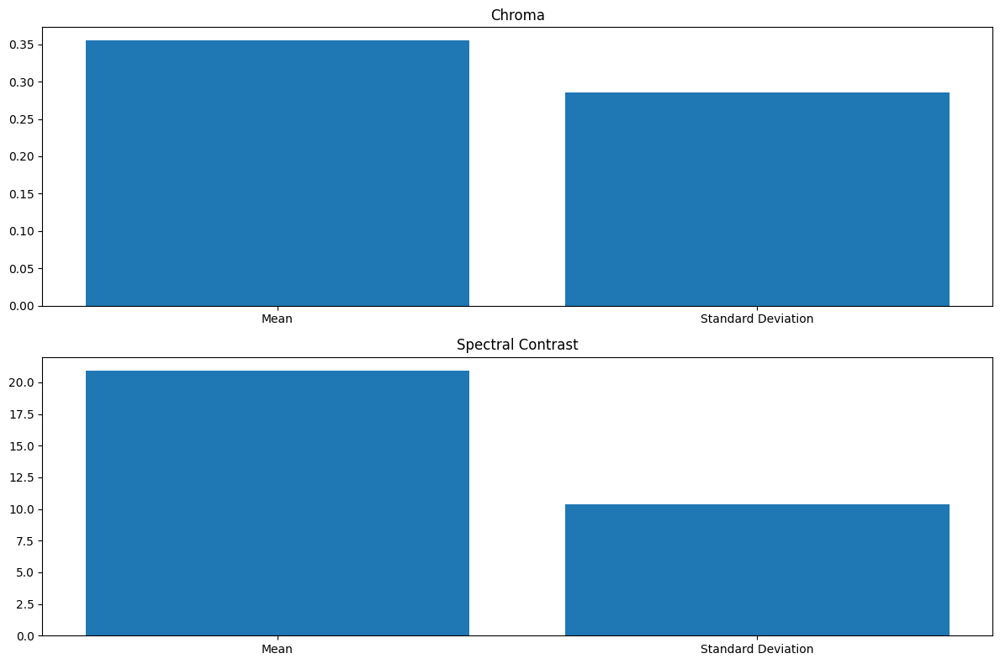

In [18]:
# Créer une figure et des axes
fig, axs = plt.subplots(2, 1, figsize=(12, 8))

# Visualiser le ton chromatique
axs[0].bar(['Mean', 'Standard Deviation'], [mean_C, std_C])
axs[0].set_title('Chroma')

# Visualiser le contraste spectral
axs[1].bar(['Mean', 'Standard Deviation'], [mean_contrast, std_contrast])
axs[1].set_title('Spectral Contrast')


# Afficher la figure
plt.tight_layout()
plt.show()

In [20]:
# Créer un DataFrame avec les mesures que vous avez calculées
df = pd.DataFrame({
    'Mean Mel spectrogram': [mean_S],
    'Standard deviation Mel spectrogram': [std_S],
    'Mean Chroma': [mean_C],
    'Standard deviation Chroma': [std_C],
    'Mean Spectral contrast': [mean_contrast],
    'Standard deviation Spectral contrast': [std_contrast]
})

# Ajouter des colonnes pour le sexe et la langue
df['Transcription'] = ['']
df['Langue'] = ['']  

print(df)

   Mean Mel spectrogram  Standard deviation Mel spectrogram  Mean Chroma  \
0              6.196176                           52.891155     0.355034   

   Standard deviation Chroma  Mean Spectral contrast  \
0                   0.285525               20.952445   

   Standard deviation Spectral contrast Transcription Sexe Langue  
0                             10.401012                            


### DATA AUGMENTATIONS

Méthodes utilisées :
    Suppression du bruit 
    Insertion du bruit 
    Décalage temporel 
    Augmentation de la vitesse 
    Diminution de la vitesse 
    Découpage d'une partie de l'enregistrement
    Mix de plusieurs enregistrements selon plusieurs langues 

In [ ]:
import speech_recognition as sr


# Chemin pour sauvegarder le fichier CSV
csv_file = "C:/Users/angej/Desktop/Multilingual/Multilanguage/Code/CsvAug.csv"

# Créer un recognizer de la librairie speech_recognition
r = sr.Recognizer()

# AudioFile pour chaque fichier audio
audio_files = ['C:/Users/angej/Desktop/Multilingual/Data_augmentation/Data_augmentation/dos1_augf3_aug/f3_aug_cut_part.wav'
            ]

# Créer une liste pour stocker les nouvelles données
nouvelles_donnees = []


# Demander à l'utilisateur de sélectionner la langue
lang_code = None
while lang_code is None:
    lang_code = select_language()

print("Code de langue sélectionné :", lang_code)


for audio_file in audio_files:
    with sr.AudioFile(audio_file) as source:
        audio_data = r.record(source)     
        text = r.recognize_google(audio_data,language=lang_code)
        
        # Utiliser langid pour déterminer la langue
        lang, _ = langid.classify(text) 
        # Ajouter les nouvelles données à la liste
        nouvelles_donnees.append({'Audio': audio_file,
                                'Transcription': text,
                                })
try:
    with open(csv_file, 'r') as file:
        # Vérifier si le fichier CSV existe déjà
        if os.path.isfile(csv_file):
            # Charger le DataFrame depuis le fichier CSV
            df = pd.read_csv(csv_file)
            
            # Ajouter les nouvelles données au DataFrame existant
            if not df.empty:
                # Convertir les nouvelles données en un DataFrame
                nouvelles_donnees_df = pd.DataFrame(nouvelles_donnees)
                
                # Ajouter les nouvelles données au DataFrame existant
                df = pd.concat([df, nouvelles_donnees_df], ignore_index=True, axis=0)
            else:
                # Créer un DataFrame avec les nouvelles données si le DataFrame est vide
                df = pd.DataFrame(nouvelles_donnees)
        else:
            # Créer un DataFrame avec les nouvelles données si le fichier n'existe pas
            df = pd.DataFrame(nouvelles_donnees)
except Exception as e:
    print("Une erreur est survenue lors de la lecture du fichier CSV :", e)

# Sauvegarder le DataFrame complet dans un fichier CSV
df.to_csv(csv_file, index=False)

# Afficher le DataFrame
print(df)

In [23]:
# Charger le fichier audio
Audio_Aug, sr = librosa.load("C:/Users/angej/Desktop/Multilingual/What to do after being vaccinated/02_what_to_do_after_being_vaccinated_fr.wav")

# Afficher l'audio en utilisant le taux d'échantillonnage
display(Audio(data=Audio_Aug, rate=sr))

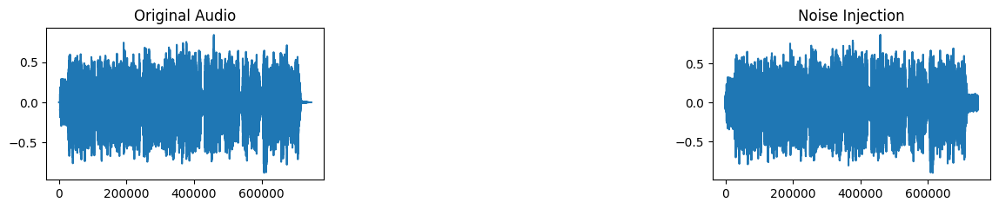

In [24]:
# Function to apply noise injection 8%
def noise_injection(data, noise_level):
    noise = np.random.normal(0, noise_level, len(data))
    return data + noise

noisy_data = noise_injection(Audio_Aug, noise_level=0.030)

plt.figure(figsize=(14, 5))
plt.subplot(2, 3, 1)
plt.plot(Audio_Aug)
plt.title('Original Audio')

plt.subplot(2, 3, 3)
plt.plot(noisy_data)
plt.title('Noise Injection')

plt.show()

ipd.Audio(noisy_data, rate=sr)

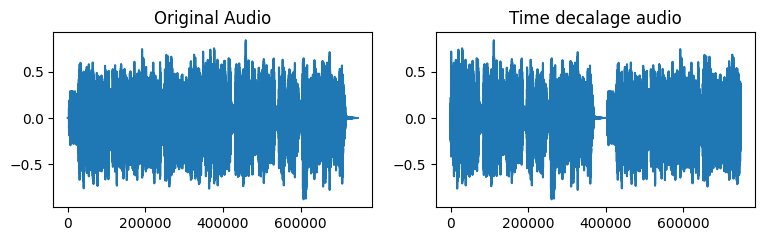

In [25]:
#Effectuation d'un décalage temporel : faire commencer l'enregistrement à une autre période 
augmented_audio = np.roll(Audio_Aug, 400000 )

plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_Aug)
plt.title('Original Audio')


plt.subplot(2, 3, 2)
plt.plot(augmented_audio)
plt.title('Time decalage audio')

plt.show()

ipd.Audio(augmented_audio, rate=sr)

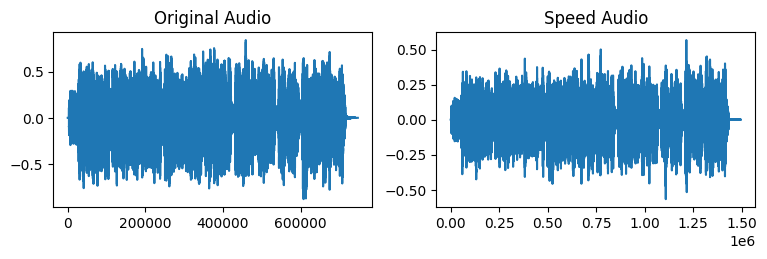

In [26]:
#Changement de vitesse  accéléré
#Quand inférieur à 1 décélération , quand supérieur à 1 accélération 
rate = 0.5
speed_audio = librosa.effects.time_stretch(Audio_Aug, rate = rate)
plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_Aug)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(speed_audio)
plt.title('Speed Audio')

plt.show()

display(Audio(data=speed_audio, rate=sr))


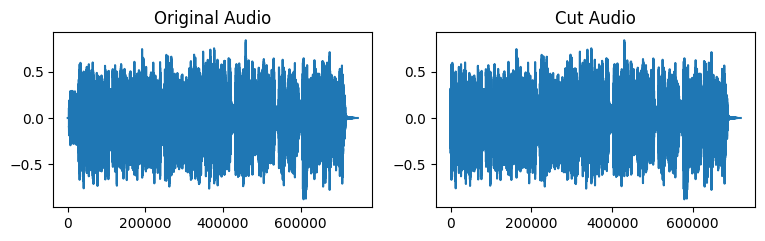

In [28]:
#Suppression des bruits au début et  à la fin 

debut = 1.3
fin = 38.0
signal_coupe = Audio_Aug[int(debut * sr):int(fin * sr)]


plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_Aug)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(signal_coupe)
plt.title('Cut Audio')

plt.show()

ipd.Audio(signal_coupe, rate=sr)


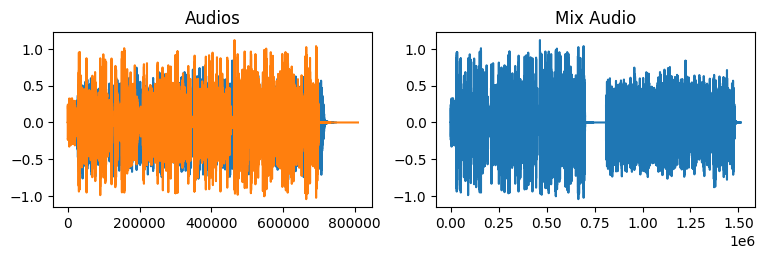

In [29]:
# Charger les deux enregistrements audio
audio_un, sr1 = librosa.load("C:/Users/angej/Desktop/Multilingual/What to do after being vaccinated/02_what_to_do_after_being_vaccinated_fr.wav")
audio_deux, sr2 = librosa.load("C:/Users/angej/Desktop/Multilingual/Beware_of_false_experts/2020_03_25_000030-ci-covid19-unesco_msg03_eng.wav")

# Vérifier que les fréquences d'échantillonnage sont identiques
if sr1 != sr2:
    raise ValueError("Les fréquences d'échantillonnage des deux fichiers audio doivent être identiques.")

# Définir le point d'insertion (en secondes)
point_insertion = 2.0


# Créer un nouveau signal en concaténant les deux
signal_concatene = np.concatenate((audio_deux, audio_un[int(point_insertion * sr2):]))

plt.figure(figsize=(14,5))

plt.subplot(2, 3, 1)
plt.plot(audio_un)
plt.title('Audios')

plt.subplot(2, 3, 1)
plt.plot(audio_deux)
plt.title('Audios')


plt.subplot(2, 3, 2)
plt.plot(signal_concatene)
plt.title('Mix Audio')

plt.show()

ipd.Audio(signal_concatene, rate=sr1)

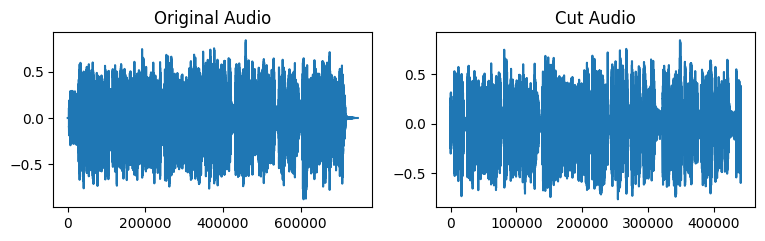

In [30]:
#  Couper une partie d'un enregistrement 

debut = 5.0
fin = 25.0
signal_coupe = Audio_Aug[int(debut * sr):int(fin * sr)]


plt.figure(figsize=(14, 5))

plt.subplot(2, 3, 1)
plt.plot(Audio_Aug)
plt.title('Original Audio')

plt.subplot(2, 3, 2)
plt.plot(signal_coupe)
plt.title('Cut Audio')

plt.show()

ipd.Audio(signal_coupe, rate=sr)


In [31]:
###Preparation des données pour l'entrainement du modèle

In [3]:
import pandas as pd

# Chargement du fichier CSV
df = pd.read_csv("C:/Users/angej/Desktop/Multilingual/Multilanguage/Code/CsvAug.csv", sep=",")

# Exploration des données
print(df.head())



                                               Audio  \
0  C:/Users/angej/Desktop/Multilingual/Data_augme...   
1  C:/Users/angej/Desktop/Multilingual/Data_augme...   
2  C:/Users/angej/Desktop/Multilingual/Data_augme...   
3  C:/Users/angej/Desktop/Multilingual/Data_augme...   
4  C:/Users/angej/Desktop/Multilingual/Data_augme...   

                                       Transcription Langue        Tempo  \
0  Are you parents Take advantage of confinement ...     en  143.5546875   
1  only trust official information sources and cr...     en  143.5546875   
2  Are you parents Take advantage of confinement ...     en  143.5546875   
3  are you a parent now that she was spending mor...     en  143.5546875   
4  are you a parent now that you are spending mor...     en  143.5546875   

  Mean Mel spectrogram Standard deviation Mel spectrogram Mean Chroma  
0             6.196176                          52.891155         NaN  
1             6.196176                          52.891155     

In [4]:
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 295 entries, 0 to 294
Data columns (total 7 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Audio                               295 non-null    object
 1   Transcription                       295 non-null    object
 2   Langue                              295 non-null    object
 3   Tempo                               284 non-null    object
 4   Mean Mel spectrogram                284 non-null    object
 5   Standard deviation Mel spectrogram  284 non-null    object
 6   Mean Chroma                         278 non-null    object
dtypes: object(7)
memory usage: 16.3+ KB
None


In [6]:
# Remplace les valeurs manquantes par la valeur "Inconnu"
df = df.fillna("Inconnu")


In [8]:
from sklearn.model_selection import train_test_split

# Définir la taille des ensembles
test_size = 0.2  # 20% pour le test
validation_size = 0.1  # 10% pour la validation

X = df.iloc[:,0].values
y = df.iloc[:,1].values

# Diviser les données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=3)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=validation_size / (1 - test_size), random_state=42)

# Afficher les tailles des ensembles
print("Taille de l'ensemble d'apprentissage:", len(X_train))
print("Taille de l'ensemble de validation:", len(X_val))
print("Taille de l'ensemble de test:", len(X_test))


Taille de l'ensemble d'apprentissage: 206
Taille de l'ensemble de validation: 30
Taille de l'ensemble de test: 59
